<a href="https://colab.research.google.com/github/architect-code/ST463/blob/main/ST459%2C_Quantum_Computation_and_Information.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%pip install pennylane

In [ ]:
import numpy as np
import pennylane as qml

**Important: Qubit ordering convention, notation and how the document is organized.**

In PennyLane, qubits are indexed numerically from left to right. Therefore, a state such as $\mathbf{10100}$ indicates that the first and third qubit (or, *wires* 0 and 2) are in state $\mathbf{1}$ and the second, fourth, and fifth qubit are in state $\mathbf{0}$.  When drawing *quantum circuits*, our convention is that the leftmost (first) qubit is at the *top* of the circuit.

Sometimes, it may happen that we will use the *bra-ket* notation; see the following Wikipedia link: https://en.wikipedia.org/wiki/Bra%E2%80%93ket_notation, and the "Important notational" remark in the lecture notes, Page 1.

Also, the main sections correspond to the main sections in the lecture notes, but this does not necessarely apply to the subsections.

# 1 Qubits.

## Single qubit.

In this code exercise, you are given an unnormalized vector:
\begin{equation}
    \beta = \beta_0 \mathbf{0} + \beta_1 \mathbf{1},\quad |\beta_0|^2+|\beta_1^2|\neq 1,
\end{equation}

which is a *non* valid quantum state. We can turn this into an equivalent, valid quantum state $\beta^{'}$ by *normalizing* it.

**Exercise**

Verify that the superposition state
\begin{equation*}
    \beta = \frac{3}{5}\mathbf{0} - \frac{4}{5}e^{\frac{\pi}{6} i}\mathbf{1}
\end{equation*}
is normalized.

**Solution**


To verify this, we can take the inner product of the state with itself and check that the result is 1.

\begin{equation*}
\langle \beta, \beta \rangle= \frac{9}{25}+\frac{16}{25}= 1.
\end{equation*}

In [ ]:
def normalize_state(beta_0, beta_1):
    """Compute a normalized quantum state given arbitrary amplitudes.
    Args:
        beta_0 (complex): The amplitude associated with the 0 state.
        beta_1 (complex): The amplitude associated with the 1 state.

    Returns:
        np.array[complex]: A vector (numpy array) with 2 elements that represents
        a normalized quantum state.
    """
    # Computing the Euclidean norm
    norm = np.sqrt(((np.abs(beta_0)) ** 2) + ((np.abs(beta_1)) ** 2))
    # Multiply each entry of the vector by 1/norm
    return (1/norm) * np.array([beta_0, beta_1])

#Example: Normalization of (1/2,1/2)
print(normalize_state(1/2, 1/2))

[0.70710678 0.70710678]


In this code exercise, instead, we compute the inner product between two arbitrary states, and then we verify that $\mathbf{0}$ and $\mathbf{1}$ form an **orthonormal basis**; in the code, $\mathbf{0}$ and $\mathbf{1}$ are denoted by ket_0 and ket_1 respectively.   

In [ ]:
def inner_product(state_1, state_2):
    """Compute the inner product between two states.

    Args:
        state_1 (np.array[complex]): A normalized quantum state vector
        state_2 (np.array[complex]): A second normalized quantum state vector

    Returns:
        complex: The value of the inner product <state_1 | state_2>.
    """
    # Using the physicist's inner product convention (i.e., conjugate linear in the 1st entry)
    return (np.conj(state_1[0]) * state_2[0]  +  np.conj(state_1[1]) * state_2[1] )

# Example 1
ket_0 = np.array([1, 0]) # 0
ket_1 = np.array([0, 1]) # 1

print(f"<0|0> = {inner_product(ket_0, ket_0)}")
print(f"<0|1> = {inner_product(ket_0, ket_1)}")
print(f"<1|0> = {inner_product(ket_1, ket_0)}")
print(f"<1|1> = {inner_product(ket_1, ket_1)}")

# Example 2
s_1 = np.array([1, 1j])
s_2 = np.array([3+4j, 17])

print(f"<s_1|s_2> = {inner_product(s_1,s_2)}")

<0|0> = 1
<0|1> = 0
<1|0> = 0
<1|1> = 1
<s_1|s_2> = (3-13j)


A **quantum operation** can be represented by a matrix. To preserve normalization, it must be a special type of matrix called a **unitary** matrix. E.g., for some $2 \times 2$ complex-valued unitary matrix $U$, the state of the qubit after an operation is $\beta^{'} = U \beta$. The code below apply a *quantum operation*, precisely the *Hadamard* operation. In PennyLane, the Hadamard operation or *gate* is implemented via the function *qml.Hadamard*.

The *Hadamard* gate is special because it can create a *uniform superpositions* of the states $\mathbf{0}$ and $\mathbf{1}$, as we will see below.

In [ ]:
#Initialize the unitary (Hadamard)
H = np.array([[1, 1], [1, -1]]) / np.sqrt(2)

def apply_h(state):
    """Apply a quantum operation.

    Args:
        state (np.array[complex]): A normalized quantum state vector.

    Returns:
        np.array[complex]: The output state after applying U.
    """

    #Use standard matrix mulitplication from numpy
    return np.matmul(H,state)

# Example
plus = np.array([1/np.sqrt(2),1/np.sqrt(2)])
print(apply_h(plus))

[1.00000000e+00 2.23711432e-17]


In this code exercise, the fuction *measure_state* takes a quantum state vector as input and simulates the outcomes of an arbitrary number of **quantum measurements**,  i.e., return a list of samples  or  based on the probabilities given by the input state.

In [ ]:
def measure_state(state, num_meas):
    """Simulate a quantum measurement process.

    Args:
        state (np.array[complex]): A normalized qubit state vector.
        num_meas (int): The number of measurements to take

    Returns:
        np.array[int]: A set of num_meas samples, 0 or 1, chosen according to the probability
        distribution defined by the input state.
    """
    #First argument is the possibility space, second argument is the size of the sample, third argument is the probability distribution
    return np.random.choice(np.array([0,1]), num_meas, p = [np.abs(state[0]) ** 2, np.abs(state[1]) ** 2])

# Example
state = np.array([0.8, 0.6])
print(measure_state(state, 10))

[0 0 1 0 0 0 1 0 1 0]


At this point, we have all the ingredients to write a very simple quantum simulator that can simulate the outcome of running quantum algorithms on a single qubit. We will:


1.   Initialize a qubit in state $\mathbf{0}$.
2.   Apply the provided operation $U$.
3.   Simulate measuring the output state 100 times

In [ ]:
U = np.array([[1, 1], [1, -1]]) / np.sqrt(2)

def initialize_state():
    """Prepare a qubit in state |0>.

    Returns:
        np.array[float]: the vector representation of state |0>.
    """
    return np.array([1,0])

def apply_u(state):
    """Apply a quantum operation."""
    return np.dot(U, state)

def measure_state(state, num_meas):
    """Measure a quantum state num_meas times."""
    p_beta0 = np.abs(state[0]) ** 2
    p_beta1 = np.abs(state[1]) ** 2
    meas_outcome = np.random.choice([0, 1], p=[p_beta0, p_beta1], size=num_meas)
    return meas_outcome

def quantum_algorithm():
    """Use the functions above to implement the quantum algorithm described above.

    Try and do so using three lines of code or less!

    Returns:
        np.array[int]: the measurement results after running the algorithm 100 times
    """
    # Apply U to 0
    state = np.matmul(U,initialize_state())

    # Return the array of 100 measurement outcomes
    return measure_state(state,100)

print(quantum_algorithm())

[1 1 0 0 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0 0 0 1 0 1 0 0 1 1 0 1 1 1 1 0 1
 0 1 0 1 1 0 1 0 0 0 0 0 1 1 1 1 1 1 0 1 0 0 0 0 0 0 1 1 1 1 0 1 1 1 1 1 0
 0 0 1 1 0 1 1 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0]


We finish this section with a roadmap on *quantum operations* or *gates* and measurements on single qubits, by using the PennyLane libraries.

**Flipping bits**

A common use of the *X*  gate (*bit flip* or *NOT* gate) is in initializing the state of a qubit at the beginning of an algorithm. Quite often, we would like our qubits to start in state $\mathbf{0}$  (which is the default in PennyLane); however, there are many cases where we instead would like to start from $\mathbf{1}$.  The function below, via *qml.PauliX*, initializes the qubit's state to $\mathbf{0}$  or $\mathbf{1}$  based on an input flag. Then, by using *qml.QubitUnitary* it applies the provided unitary $U$.

In [ ]:
dev = qml.device("default.qubit", wires=1)

U = np.array([[1, 1], [1, -1]]) / np.sqrt(2)

@qml.qnode(dev)
def varied_initial_state(state):
    """The function allows us to apply the operation U to
    either |0> or |1> depending on the input argument flag.

    Args:
        state (int): Either 0 or 1. If 1, prepare the qubit in state |1>,
            otherwise, leave it in state 0.

    Returns:
        array[complex]: The state of the qubit after the operations.
    """
    # KEEP THE QUBIT IN |0> OR CHANGE IT TO |1> DEPENDING ON THE state PARAMETER
    if state == 1:
        qml.PauliX(wires = 0)
    # APPLY U TO THE STATE
    qml.QubitUnitary(U, wires = 0)

    return qml.state()

**Uniform superposition (see also below)**

The following code exercise:


1.   applies a Hadamard gate to the qubit,
2.   returns the *state* of the qubit with *qml.state*.

In [ ]:
dev = qml.device("default.qubit", wires=1)

@qml.qnode(dev)
def apply_hadamard():
    # APPLY THE HADAMARD GATE
    qml.Hadamard(wires = 0)
     # RETURN THE STATE
    return qml.state()

Now let's combine what we've just learned. We create a device with one qubit. Then, we write a QNode that applies the following circuit and returns the state.

hxh.svg

In [ ]:
# CREATE A DEVICE
dev = qml.device("default.qubit", wires = 1)

# CREATE A QNODE CALLED apply_hxh THAT APPLIES THE CIRCUIT ABOVE
@qml.qnode(dev)
def apply_hxh(state):
    if state == 1:
        qml.PauliX(wires = 0)
    qml.Hadamard(wires = 0)
    qml.PauliX(wires = 0)
    qml.Hadamard(wires = 0)
    return qml.state()

# Print your results
print(apply_hxh(0))
print(apply_hxh(1))

[1.+0.j 0.+0.j]
[ 0.+0.j -1.+0.j]


**The Pauli Z gate**

The Pauli $Z$ gate (*phase flip*) is defined by its action on the computational basis states: $\mathbf{0}\rightarrow\mathbf{0}$ and $\mathbf{1}\rightarrow-\mathbf{1}$. In PennyLane, you can implement it by calling *qml.PauliZ*.

We write a QNode that applies *qml.PauliZ* to the state $H(\mathbf{0})$, denoted by $|+\rangle$ in the code below.

In [ ]:
dev = qml.device("default.qubit", wires=1)

@qml.qnode(dev)
def apply_z_to_plus():
    """Write a circuit that applies PauliZ to the |+> state and returns
    the state.

    Returns:
        np.array[complex]: The state of the qubit after the operations.
    """

    # CREATE THE |+> STATE
    qml.Hadamard(wires = 0)

    # APPLY PAULI Z
    qml.PauliZ(wires = 0)

    # RETURN THE STATE
    return qml.state()

print(apply_z_to_plus())

[ 0.70710678+0.j -0.70710678+0.j]


## Qubit pair

### Quantum circuits in PennyLane, Devices and QNodes; general presentation, not necessarely tailored for Qubit pair.

In PennyLane, a quantum circuit is represented by a **quantum function**. These are just regular Python functions, with some special properties: they must apply one or more quantum (unitary) operations, and return one or more quantum measurements.

Suppose we would like to write a circuit for two qubits. As said, by default in PennyLane, qubits (*wires*) are ordered numerically starting from 0 (which corresponds to the top qubit in the circuit). In pseudocode, a quantum function looks something like this:

In [ ]:
def my_quantum_function(params):

    # Single-qubit operations with no input parameters
    qml.Gate1(wires=0)
    qml.Gate2(wires=1)

    # A single-qubit operation with an input parameter
    qml.Gate3(params[0], wires=0)

    # Two-qubit operation with no input parameter on wires 0 and 1
    qml.TwoQubitGate1(wires=[0, 1])

    # Two-qubit operation with an input parameter on wires 0 and 1
    qml.TwoQubitGate2(params[1], wires=[0, 1])

    # Return the result of a measurement
    return qml.Measurement(wires=[0, 1])

In PennyLane, a quantum function alone isn't enough to run and execute a circuit. For this we need two extra parts (we have used it also above):


1.   a device to run the circuit on.
2.   a QNode, which binds the circuit to the device, and executes it.

Our devices will be **quantum simulators**, but PennyLane provides plugins that enable us to run on real quantum hardware as well! To construct a device in PennyLane, we need to know the name or type of the device, and the number of qubits (wires) it has:

In [ ]:
# dev = qml.device('device.name', wires=num_qubits)

Unless stated otherwise, we will always be using the _default.qubit_ device, which is a standard quantum simulator. You can also give string labels to the wires on a device.

In [ ]:
#dev = qml.device('default.qubit', wires=["wire_a", "wire_b"])

Once we have a device, we can construct a QNode. QNodes are the main unit of quantum computation in PennyLane.

qnode.svg

There are two ways to construct a QNode from a device and a quantum function. The first method uses the qml.QNode function:





In [ ]:
#my_qnode = qml.QNode(my_circuit, my_device)

Once a QNode is created, it can be called like a function using the same parameters as the quantum function upon which it's built.

The second way to construct a QNode in PennyLane is using a decorator. Decorating a quantum function with *@qml.qnode(dev)* will automatically produce a QNode with the same name as your function that can be run on the device

In [ ]:
#dev = qml.device('default.qubit, wires = [0,1])
#@qml.qnode(dev)

**Example (with 3 qubits and rotations)**

circuit_i-2-2.svg

In [ ]:
# Create a device with three wires on which PennyLane can run computations
dev = qml.device("default.qubit", wires=3)

# Circuit
def my_circuit(theta, phi, omega):
    qml.RX(theta, wires =[0])
    qml.RY(phi, wires = [1])
    qml.RZ(omega, wires = [2])
    qml.CNOT(wires =[0,1])
    qml.CNOT(wires = [1,2])
    qml.CNOT(wires =[2,0])
    return qml.probs(wires=[0, 1, 2])

# This creates a QNode, binding the function and device
my_qnode = qml.QNode(my_circuit, dev)

# We set up some values for the input parameters
theta, phi, omega = 0.1, 0.2, 0.3

# Now we can execute the QNode by calling it like we would a regular function
my_qnode(theta, phi, omega)

array([9.87560268e-01, 0.00000000e+00, 0.00000000e+00, 2.47302134e-03,
       2.48960206e-05, 0.00000000e+00, 0.00000000e+00, 9.94181506e-03])

In [ ]:
dev = qml.device("default.qubit", wires=3)

# Apply the decorator to the quantum function
@qml.qnode(dev)
def my_circuit(theta, phi, omega):
    qml.RX(theta, wires=0)
    qml.RY(phi, wires=1)
    qml.RZ(omega, wires=2)
    qml.CNOT(wires=[0, 1])
    qml.CNOT(wires=[1, 2])
    qml.CNOT(wires=[2, 0])
    return qml.probs(wires=[0, 1, 2])

theta, phi, omega = 0.1, 0.2, 0.3

# Run the circuit
my_circuit(theta, phi, omega)

array([9.87560268e-01, 0.00000000e+00, 0.00000000e+00, 2.47302134e-03,
       2.48960206e-05, 0.00000000e+00, 0.00000000e+00, 9.94181506e-03])

### Bell states.


Consider the **Bell states**:
\begin{equation*}
\psi_{+}:=\frac{1}{\sqrt{2}}(\mathbf{00}+\mathbf{11}),\,\,\psi_{-}:=\frac{1}{\sqrt{2}}(\mathbf{00}-\mathbf{11}),\,\,\phi_{+}:=\frac{1}{\sqrt{2}}(\mathbf{01}+\mathbf{10}),\quad\phi_{-}:=\frac{1}{\sqrt{2}}(\mathbf{01}-\mathbf{10}).
\end{equation*}

In this code exercise, we write a set of 4 circuits that prepare and return each of the four Bell states.

In [ ]:
dev = qml.device('default.qubit', wires=2)
# Starting from the state |00>, implement a PennyLane circuit
# to construct each of the Bell basis states.

@qml.qnode(dev)
def prepare_psi_plus():
    # PREPARE (1/sqrt(2)) (|00> + |11>)
    qml.Hadamard(wires = 0)
    qml.CNOT(wires = [0,1])
    return qml.state()


@qml.qnode(dev)
def prepare_psi_minus():
    # PREPARE (1/sqrt(2)) (|00> - |11>)
    qml.PauliX(wires = 0)
    qml.Hadamard(wires = 0)
    qml.CNOT(wires = [0,1])
    return qml.state()


@qml.qnode(dev)
def prepare_phi_plus():
    # PREPARE  (1/sqrt(2)) (|01> + |10>)
    qml.Hadamard(wires = 1)
    qml.PauliX(wires = 0)
    qml.CNOT(wires = [1,0])
    return qml.state()


@qml.qnode(dev)
def prepare_phi_minus():
    # PREPARE  (1/sqrt(2)) (|01> - |10>)
    qml.PauliX(wires = 1)
    qml.Hadamard(wires = 1)
    qml.PauliX(wires = 0)
    qml.PauliX(wires = 1)
    qml.CNOT(wires = [1,0])
    return qml.state()

### Quantum entanglement.

In this code exercise, we implement the following circuit and inspect the output state. Can you argue why this state is entangled?

bell_normal.svg

In [ ]:
dev = qml.device("default.qubit", wires=2)

@qml.qnode(dev)
def apply_h_cnot():

    # APPLY THE OPERATIONS IN THE CIRCUIT
    qml.Hadamard(wires=0)
    qml.CNOT(wires=[1,0])

    return qml.state()


print(apply_h_cnot())

# This is the maximally entangled bell state B_00
state_status = "entangled"

[0.70710678+0.j 0.        +0.j 0.70710678+0.j 0.        +0.j]


## Multiple qubits


### Create a uniform superposition.

We can justify uniform superposition with the following objective: discover the secret combination that opens a lock.  Suppose that such combination is described by $n$ bits. The naive method would be to try all $2^{n}$  combinations one by one. Would a quantum computer make this task easier? Naively, it looks as if we could create a uniform superposition over all $n$-bit strings and immediately determine the correct combination. After all, the uniform superposition encodes all possible combinations in a single state.

We know that to create a uniform superposition over all possible $n$-qubit basis states, we can apply:

\begin{equation*}
    (H \otimes H \otimes ⋯ \otimes H)|0 ⋯ 0⟩ = \frac{1}{\sqrt{2^n}}\sum_{\mathbf{x}\in\{0,1\}^n} |\mathbf{x}⟩,
\end{equation*}
where we use bold letters for string of $n$ bits, $\mathbf{x}\in\{0,1\}^n$.  In particular, the string of  zeros will be denoted by $\mathbf{0}$. Thus, we can write the uniform superposition $|ψ⟩ = H^{⊗ n}|\mathbf{0}⟩$, where $H^{⊗ n}$ is the $n$-fold tensor product of Hadamart gates.

This will prepare a state that includes the correct combination (or solution) $|\mathbf{s}⟩$, so if we measure, we should find it. But by itself, this doesn't help us break the lock, since the superposition includes everything else as well. Once we open the quantum computer and look inside, we may observe the correct lock combination, but we might also see an incorrect combination, due to the probabilistic nature of quantum computation. If we start in the even superposition for $n$ bits, our chance of observing the correct answer is $1/2^{n}$. A quantum superposition may look like it can result in an exponential number of things being done at once, but once we take a measurement, we will only get a random snapshot of what it's done. Quantum algorithms are all about shuffling around this exponential collection of terms in the superposition so that, when we observe the system, our random snapshot has a high probability of showing us the thing we are looking for. And given that our algorithms involve randomness, we also should be comparing them to *random classical algorithms*, like guessing the combination.

In this code exercise, we create the uniform superposition over $n$ qubits. It will also plot the probability of observing different outcomes.

uniform.svg

In [ ]:
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

@qml.qnode(dev)
def naive_circuit():
    """Create a uniform superposition and return the probabilities.

    Returns:
        array[float]: Probabilities for observing different outcomes.
    """

    for wire in range(n_bits):
        qml.Hadamard(wires = wire)

    return qml.probs(wires=range(n_bits))

### The Hadamard transform for multiple solutions.

Let's think a bit more about how lock-breaking actually works. Call the correct combination for an $n$-bit lock $\mathbf{s} \in \{0,1\}^n$. We can model the lock as a function $f$ from $n$-bit string $\mathbf{x} \in \{0,1\}^n$ to a bit $y \in \{0,1\}$, with $f(\mathbf{x})=0$ meaning "the combination doesn't work" and $f(\mathbf{x})=1$ meaning "the combination work".

We'll assume that the function $f$  is a black box that the computer (quantum or classical) cannot look inside. However, the computer can *ask* the black box if a combination is correct, and get a "yes" or "no" answer immediately. In computer science, such a black box is called an **oracle**, since its inner workings appear mysterious. The act of shaking it and letting the answer emerge is called a **query**.

When thinking about an oracle in the quantum case, we need to be careful about what it is doing, since only *unitary* operations are allowed. A clever choice is to put the oracle's answer into a *phase*: $U_f|\mathbf{x}⟩ → (-1)^{f(\mathbf{x})}|\mathbf{x}⟩$; Since this acts on a given basis state, and does not change the size of the amplitude, it is immediate that the oracle is unitary. It can be proved (try!!) that we can also write the oracle in terms of the identity matrix  and projector as follows:

\begin{equation*}
U_{f} = I - 2 |\mathbf{s}⟩⟨\mathbf{s}|,
\end{equation*}

where $|\mathbf{s}⟩$ is the right $n$-bit combination for the lock (see above) as a basis vector; notice that $|\mathbf{s}⟩⟨\mathbf{s}|$ is the so-called **projecton** operator $P_{\mathbf{s}}$. Applying the oracle is called a **query**. It tells us when the combination is correct by flipping the sign, so we can try to incorporate it into our lock-breaking circuit. Let's start by creating the oracle operation as a matrix. The simplest way to do this is to create the $2^{n} × 2^{n}$  *identity matrix* and then simply change the entry corresponding to the solution from $+1$ to $-1$.

In this code exercise, we write a function that returns the oracle in matrix form for a given secret combination.

In [ ]:
def oracle_matrix(combo):
    """Return the oracle matrix for a secret combination.

    Args:
        combo (list[int]): A list of bits representing a secret combination.

    Returns:
        array[float]: The matrix representation of the oracle.
    """
    my_array = np.identity(2**len(combo)) # Create the identity matrix
    index = np.ravel_multi_index(combo, [2]*len(combo)) # Index of solution

    # MODIFY DIAGONAL ENTRY CORRESPONDING TO SOLUTION INDEX
    my_array[index,index] = -1
    return my_array

Let's add the oracle to our circuit and see if we fare better than just creating the uniform superposition. Here is the circuit we want to implement:


uniform-oracle.svg

In [ ]:
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

@qml.qnode(dev)
def oracle_circuit(combo):
    """Create a uniform superposition, apply the oracle, and return probabilities.

    Args:
        combo (list[int]): A list of bits representing a secret combination.

    Returns:
        list[float]: The output probabilities.
    """
    #Uniform superposition
    for wire in range(n_bits):
        qml.Hadamard(wires = wire)

    #Apply U_f
    qml.QubitUnitary(oracle_matrix(combo), wires = list(range(n_bits)))

    #Return probabilities
    return qml.probs(wires=range(n_bits))

Applying the oracle by itself is not enough to improve our lock picker. The problem is that we introduce a phase change which is *unobservable* (why?) without further processing. In order to make some progress, we must combine states to induce a *relative* change of phase which is detectable. To illustrate, let's take a superposition of two states $|\mathbf{x}⟩$ and $|\mathbf{y}⟩$, and apply the oracle $U_f$ defined in the previous section:
\begin{equation}
|ψ_{\mathbf{x}\mathbf{x}}⟩=\frac{1}{\sqrt{2}}(|\mathbf{x}⟩+|\mathbf{y}⟩) → \frac{1}{\sqrt{2}}((-1)^{f(\mathbf{x})}|\mathbf{x}⟩+(-1)^{f(\mathbf{y})}|\mathbf{y}⟩).
\end{equation}

Instead of working in the space spanned by $|\mathbf{x}⟩$  and $|\mathbf{y}⟩$ , we could measure in the (orthonormal) basis spanned by $\frac{1}{\sqrt{2}}(|\mathbf{x}⟩+|\mathbf{y}⟩)$  and $\frac{1}{\sqrt{2}}(|\mathbf{x}⟩-|\mathbf{y}⟩)$. If we measure and observe the second state, we know one of the states had its phase flipped, so the correct combination is either $\mathbf{x}$ or $\mathbf{y}$. But if we get $+$, then no phase got flipped and neither $\mathbf{x}$  nor $\mathbf{y}$  is the right combination. This leads to a rudimentary algorithm: test solutions in pairs. This is almost the brute-force algorithm, except that instead of searching through $2^n$ combinations, we search through $2^{n-1}$ pairs, so we improve by a constant factor.

The next step, is to have a look at the oracle in the circuit. In the quantum pair-testing scheme, for each pair labelled by $\tilde{\mathbf{x}}$  we implement the following computation:

pair-test-circuit.svg

where the top line stands for $n-1$  qubits and $U_f$ is the oracle that adds a phase to the solution $|\mathbf{s}⟩$: $U_f|\mathbf{s}⟩=-|\mathbf{s}⟩$. The last qubit will be in state $|1⟩$  if the solution is present, and $|0⟩$  if it is not.

We implement this circuit and return the probabilities on the last qubit.

In [ ]:
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

@qml.qnode(dev)
def pair_circuit(x_tilde, combo):
    """Test a pair labelled by x_tilde for the presence of a solution.

    Args:
        x_tilde (list[int]): An (n_bits - 1)-string labelling the pair to test.
        combo (list[int]): A secret combination of n_bits 0s and 1s.

    Returns:
        array[float]: Probabilities on the last qubit.
    """
    for i in range(n_bits-1): # Initialize x_tilde part of state
        if x_tilde[i] == 1:
            qml.PauliX(wires=i)

    #Apply the circuit
    qml.Hadamard(wires = n_bits-1)
    qml.QubitUnitary(oracle_matrix(combo), wires = list(range(n_bits)))
    qml.Hadamard(wires = n_bits-1)

    return qml.probs(wires=n_bits-1)

If we don't know the number of solutions, then we can test in pairs and tally up the number of times we detect one. This tally will have the same parity (i.e., odd or even) as the total number of solutions since we can only miss solutions in pairs of two. Thus, we can learn a *global property* about the function that we didn't know beforehand! Let us now use the same circuit as before to test for many solutions and learn the parity of the number of solutions. Then, we create a routine for checking the parity of a lock.

In [ ]:
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

def multisol_oracle_matrix(combos):
    """Return the oracle matrix for a set of solutions.

    Args:
        combos (list[list[int]]): A list of secret bit strings.

    Returns:
        array[float]: The matrix representation of the oracle.
    """
    my_array = np.identity(2 ** n_bits)

    indices = [np.ravel_multi_index(combo, [2]*len(combo)) for combo in combos]
    for i in range(len(combos)):
        my_array[indices[i], indices[i]] = -1
    return my_array
    pass

@qml.qnode(dev)
def multisol_pair_circuit(x_tilde, combos):
    """Implements the circuit for testing a pair of combinations labelled by x_tilde.

    Args:
        x_tilde (list[int]): An (n_bits - 1)-bit string labelling the pair to test.
        combos (list[list[int]]): A list of secret bit strings.

    Returns:
        array[float]: Probabilities on the last qubit.
    """
    for i in range(n_bits-1): # Initialize x_tilde part of state
        if x_tilde[i] == 1:
            qml.PauliX(wires=i)
    #Apply circuit
    qml.Hadamard(wires = n_bits-1)
    qml.QubitUnitary(multisol_oracle_matrix(combos), wires = list(range(n_bits)))
    qml.Hadamard(wires = n_bits-1)
    return qml.probs(wires=n_bits-1)

##  Routine for checking the parity of a lock.

def parity_checker(combos):
    parity = 0
    counter = 0
    x_tilde_strs = [np.binary_repr(n, n_bits-1) for n in range(2**(n_bits-1))]
    x_tildes = [[int(s) for s in x_tilde_str] for x_tilde_str in x_tilde_strs]

    for x_tilde in x_tildes:
        if np.isclose(multisol_pair_circuit(x_tilde, combos)[1], 1):
            counter += 1

    parity = counter % 2
    return parity

We can generalize the pair-testing scheme by applying Hadamards to every qubit! Here is the circuit diagram. The layer of Hadamards is called the **Hadamard transform**. Let's see what this circuit does in the case of a single solution.

svg.svg


In [ ]:
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

@qml.qnode(dev)
def hoh_circuit(combo):
    """A circuit which applies Hadamard-oracle-Hadamard and returns probabilities.

    Args:
        combo (list[int]): A list of bits representing a secret combination.

    Returns:
        list[float]: Measurement outcome probabilities.
    """
    qml.broadcast(qml.Hadamard, wires = list(range(n_bits)), pattern = "single")
    qml.QubitUnitary(oracle_matrix(combo), wires = list(range(n_bits)))
    qml.broadcast(qml.Hadamard, wires = list(range(n_bits)), pattern = "single")

    return qml.probs(wires=range(n_bits))

# 2 Applications

## The Deutsch-Jozsa algorithm.
From the section "The Hadamard transform for multiple solutions", the Hadamard-oracle circuit doesn't tell us the lock combination. But the amplitude of observing $\mathbf{0}$ has a particularly simple form:
\begin{equation}
\mathcal{A}_{\mathbf{0}}=⟨\mathbf{0}|H^{\otimes n} U_{f}|ψ⟩ = \frac{1}{2^n}\sum_{x \in \{0,1\}^n} (-1)^{f(x)}.
\end{equation}

Let's return to the scenario where our lock has multiple secret combinations, with a set of solution strings $S$ and non-solution strings $T$. Each solution $s \in S$  contributes $-1$ in the sum, and each non-solution $t \in T$  contributes $+1$, so that

\begin{equation}
\mathcal{A}_{\mathbf{0}}=  \frac{1}{2^n}\sum_{x \in \{0,1\}^n}(|T|-|S|).
\end{equation}

Deutsch and Jozsa noticed something very clever. The situation where $|S|=|T|$ can be called "balanced",  i.e., it has just as many solutions as non-solutions. Then the amplitude $\mathcal{A}_{\mathbf{0}}$ vanishes, and you will never observe $\mathbf{0}$! But if $f$ is "constant", with $S=∅$ or $T=∅$, then $\mathcal{A}_{\mathbf{0}}=\pm 1$ and you will always observe $\mathbf{0}$. This leads to the **Deutsch-Jozsa algorithm**. If we are given the promise that $f$ is either balanced or constant,  then applying the same set of gates and observing will tell us which it is. It just depends on whether we see $\mathbf{0}$ or not. The circuit is the same as the last node:





dj-circuit-2.svg



In this code exercise, we implement the Deutsch–Jozsa algorithm:
We can take a lock that is either constant or balanced and use our circuit to tell which it is! More formally, suppose we are given a promise that the function  is either constant or balanced. From the circuit above, we can conclude that


1.   if we measure 0, $f$ is constant (either side of the graph);
2.   if we don't measure 0,  $f$ is balanced (middle of the graph).

In [ ]:
#Required functions
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

def multisol_oracle_matrix(combos):
    """Return the oracle matrix for a set of solutions.

    Args:
        combos (list[list[int]]): A list of secret bit strings.

    Returns:
        array[float]: The matrix representation of the oracle.
    """
    my_array = np.identity(2 ** n_bits)

    indices = [np.ravel_multi_index(combo, [2]*len(combo)) for combo in combos]
    for i in range(len(combos)):
        my_array[indices[i], indices[i]] = -1
    return my_array
    pass

@qml.qnode(dev)
def multisol_pair_circuit(x_tilde, combos):
    """Implements the circuit for testing a pair of combinations labelled by x_tilde.

    Args:
        x_tilde (list[int]): An (n_bits - 1)-bit string labelling the pair to test.
        combos (list[list[int]]): A list of secret bit strings.

    Returns:
        array[float]: Probabilities on the last qubit.
    """
    for i in range(n_bits-1):
        if x_tilde[i] == 1:
            qml.PauliX(wires=i)
    qml.Hadamard(wires = n_bits-1)
    qml.QubitUnitary(multisol_oracle_matrix(combos), wires = list(range(n_bits)))
    qml.Hadamard(wires = n_bits-1)
    return qml.probs(wires=n_bits-1)

@qml.qnode(dev)
def multisol_hoh_circuit(combos):
    """A circuit which applies Hadamard, multi-solution oracle, then Hadamard.

    Args:
        combos (list[list[int]]): A list of secret bit strings.

    Returns:
        array[float]: Probabilities for observing different outcomes.
    """
    qml.broadcast(qml.Hadamard, wires = list(range(n_bits)), pattern = "single")
    qml.QubitUnitary(multisol_oracle_matrix(combos), wires = list(range(n_bits)))
    qml.broadcast(qml.Hadamard, wires = list(range(n_bits)), pattern = "single")

    return qml.probs(wires=range(n_bits))

def deutsch_jozsa(promise_var):
    """Implement the Deutsch–Jozsa algorithm and guess the promise variable.

    Args:
        promise_var (int): Indicates whether the function is balanced (0) or constant (1).

    Returns:
        int: A guess at the promise variable.
    """
    if promise_var == 0:
        how_many = 2**(n_bits - 1)
    else:
        how_many = np.random.choice([0, 2**n_bits]) # Choose all or nothing randomly
    combos = multisol_pair_circuit(n_bits, how_many) # Generate random combinations

    #Use multisol function to run the Deutsch-Josza circuit, return the value corresponding to a balanced or constant function
    if np.isclose(multisol_hoh_circuit(combos)[0],0):
        return 0
    else:
        return 1

## Quantum Teleportation

See the tutorial: https://pennylane.ai/qml/demos/tutorial_teleportation

## Superdense cooding

See the lecture notes for the theory; try to understand what the code is doing.

In [ ]:
import pennylane as qml
from pennylane import numpy as np

'''
wires - Number of subsystems represented by the devices(qubits)
shots - How many times the circuit should be evaluated
'''

test_dev = qml.device("default.qubit", wires=2)         # for testing package
dev1 = qml.device("default.qubit", shots=1, wires=2)    # for demo the sender's operation
dev2 = qml.device("default.qubit", shots=1, wires=2)    # for demo the receiver's operation

xbit = 0
ybit = 0


# test circuit
@qml.qnode(test_dev)
def test_circuit(params):
    qml.RX(params[0], wires=0)
    qml.RY(params[1], wires=0)
    return qml.expval(qml.PauliZ(0))


'''
The following function designed for a simple superdense coding:
using 1 qubit to send 2 classical bits
# part a - set up accroding to the super dense coding
# part b - lookup table
'''


@qml.qnode(dev1)
def circuit1():
    # part a - construct super dense coding
    qml.Hadamard(wires=0)
    qml.CNOT(wires=[0, 1])

    # par b - lookup table
    '''
    case1: |00> -> apply I
    case2: |01> -> apply X
    case3: |10> -> apply Z
    case4: |11> -> apply XZ
    '''
    if xbit == 1:
        qml.PauliZ(wires=0)
    if ybit == 1:
        qml.PauliX(wires=0)

    # return 2 wires measurement
    return qml.probs(wires=[0, 1])


@qml.qnode(dev2)
def circuit2():
    # superdense coding sender
    qml.Hadamard(wires=0)
    qml.CNOT(wires=[0, 1])

    # sender apply operation
    if xbit == 1:
        qml.PauliZ(wires=0)
    if ybit == 1:
        qml.PauliX(wires=0)

    # receiver perform operation
    qml.CNOT(wires=[0, 1])
    qml.Hadamard(wires=0)

    return qml.probs(wires=[0, 1])


if __name__ == "__main__":
    # test circuit
    # print(test_circuit([0.54, 0.12])) - sender part

    # problem 3 a&b superdense coding
    print("The output when state is |00>: ", circuit1())

    # problem 3 c&d superdense coding   - receiver part
    print("The output of superdense coding is: ", circuit2())

The output when state is |00>:  [0. 0. 0. 1.]
The output of superdense coding is:  [1. 0. 0. 0.]


## Grover's algorithm

In the Deutsch-Jozsa algorithm, when trying to break a combination lock we tested the candidate solutions in pairs and used the **oracle** to tell when the solution was present. Now, we present a much more powerful algorithm that lets us search through lock combinations more efficiently than any classical algorithm.

To start us off, recall that the test-in-pairs algorithm told us when a solution was present, but not which member of the pair it was. It would be much more convenient if we could run our algorithm, take a measurement, and observe the solution with high probability. With this goal in mind, let's change our approach and try to shift amplitude into the solution state using our oracle and possibly other operators. This is called **amplitude amplification**. Rather than work with pairs, we are going to consider $N$ orthogonal states altogether. As usual, we'll start with the uniform superposition of these $N$  states. Suppose that the second state is the solution: We want to somehow increase its amplitude, so we're more likely to observe it when we take a measurement.

The first step is to apply the oracle which flips the sign of the amplitude for $|\mathbf{s}⟩$. Applying the oracle again will only undo the phase flip, so we need to introduce a new element here. The key insight is that, although the amplitude of $|\mathbf{s}⟩$ is equal in size to the other states, it has a *different* phase. We can write this as a difference from the uniform superposition. In fact, it will turn out the technically correct thing to do is split the state into a part proportional to the uniform superposition, and a part orthogonal to the uniform superposition.

**The diffusion and Grover operators**

Suppose we have an operator $D$ which flips the part which is orthogonal to the uniform state.  Since the orthogonal part has a small negative overlap with all other states, the effect is to steal a little of the amplitude from all the other states and pump it into the solution state. This is exactly what we want. $D$ actually stands for the diffusion operator rather than "difference", since it helps spread or diffuse the amplitude around. We should make a guess about how $D$ looks. Remember that the oracle associated with a solution $\mathbf{s}$ could be written as $U_f=I - 2 |\mathbf{s}⟩⟨\mathbf{s}|$. This flips the sign of $|\mathbf{s}⟩$ and nothing else. Now we want something which leaves the uniform superposition $|ψ⟩$ alone, but flips the sign of "everything else", i.e., the states orthogonal to $|ψ⟩$. So a good guess is

\begin{equation}
    D = 2 |ψ⟩⟨ψ|-I,
\end{equation}

with a factor of $2$ to make sure we don't get zero when applied to $|ψ⟩$. The combination $G = D U_f$ is called the **Grover operator**, and the algorithm consisting of repeatedly applying the operator, until the amplitude of $|\mathbf{s}⟩$ is maximized, is called **Grover search**. The number of such repetitions scales as $\sqrt{N}$, which represents a quadratic speedup on the best classical algorithm.

This code exercise return the amplitudes after applying the oracle to the uniform superposition. The oracle is accessible as *oracle_matrix(combo)*, where *combo* is the secret combination. Amplitudes will be plotted for *combo = [0, 0, 0, 1]*.

In [ ]:
import pennylane as qml
from pennylane import numpy as np

n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

def oracle_matrix(combo):
    """Return the oracle matrix for a secret combination.

    Args:
        combo (list[int]): A list of bits representing a secret combination.

    Returns:
        array[float]: The matrix representation of the oracle.
    """
    index = np.ravel_multi_index(combo, [2]*len(combo)) # Index of solution
    my_array = np.identity(2**len(combo)) # Create the identity matrix
    my_array[index, index] = -1
    return my_array

@qml.qnode(dev)
def oracle_amp(combo):
    """Prepare the uniform superposition and apply the oracle.

    Args:
        combo (list[int]): A list of bits representing the secret combination.

    Returns:
        array[complex]: The quantum state (amplitudes) after applying the oracle.
    """
    for i in range(n_bits):
        qml.Hadamard(wires=i)
    qml.QubitUnitary(oracle_matrix(combo), wires=[i for i in range(n_bits)])



    return qml.state()

On the other hand, this code exercise define the diffusion operator as a matrix, and visualize its effect on the amplitudes in the post-oracle state. We'll plot the amplitudes for *combo=[0, 0, 0, 0]*. Note that *oracle_matrix(combo)* remains available from the previous code exercise.






In [ ]:
n_bits = 4
dev = qml.device("default.qubit", wires=n_bits)

def oracle_matrix(combo):
    """Return the oracle matrix for a secret combination.

    Args:
        combo (list[int]): A list of bits representing a secret combination.

    Returns:
        array[float]: The matrix representation of the oracle.
    """
    index = np.ravel_multi_index(combo, [2]*len(combo)) # Index of solution
    my_array = np.identity(2**len(combo)) # Create the identity matrix
    my_array[index, index] = -1
    return my_array

@qml.qnode(dev)
def oracle_amp(combo):
    """Prepare the uniform superposition and apply the oracle.

    Args:
        combo (list[int]): A list of bits representing the secret combination.

    Returns:
        array[complex]: The quantum state (amplitudes) after applying the oracle.
    """
    for i in range(n_bits):
        qml.Hadamard(wires=i)
    qml.QubitUnitary(oracle_matrix(combo), wires=[i for i in range(n_bits)])



    return qml.state()


n_bits = 4

def diffusion_matrix():
    """Return the diffusion matrix.

    Returns:
        array[float]: The matrix representation of the diffusion operator.
    """
    I = np.eye(2**n_bits)
    phi = 1/np.sqrt(2**n_bits) * np.ones((2**n_bits))
    # FORM A DIFFERENCE OF MATRICES
    return 2*np.outer(phi,phi) -I

@qml.qnode(dev)
def difforacle_amp(combo):
    """Apply the oracle and diffusion matrix to the uniform superposition.

    Args:
        combo (list[int]): A list of bits representing the secret combination.

    Returns:
        array[complex]: The quantum state (amplitudes) after applying the oracle
        and diffusion.
    """
    for i in range(n_bits):
        qml.Hadamard(wires=i)
    qml.QubitUnitary(oracle_matrix(combo), wires=[i for i in range(n_bits)])
    qml.QubitUnitary(diffusion_matrix(), wires=[i for i in range(n_bits)])

    return qml.state()

The code below and verify that after two Grover iterations, the amplitude for the solution state is amplified. The functions *oracle_matrix(combo)* and *diffusion_matrix()* remain available.

In [ ]:
@qml.qnode(dev)
def two_difforacle_amp(combo):
    """Apply the Grover operator twice to the uniform superposition.

    Args:
        combo (list[int]): A list of bits representing the secret combination.

    Returns:
        array[complex]: The resulting quantum state.
    """
    for i in range(n_bits):
        qml.Hadamard(wires=i)
    qml.QubitUnitary(oracle_matrix(combo), wires=[i for i in range(n_bits)])
    qml.QubitUnitary(diffusion_matrix(), wires=[i for i in range(n_bits)])

    qml.QubitUnitary(oracle_matrix(combo), wires=[i for i in range(n_bits)])
    qml.QubitUnitary(diffusion_matrix(), wires=[i for i in range(n_bits)])

    return qml.state()

The previous discussion on shuffling amplitudes is hard to think about. Luckily, there is a beautiful alternative representation that makes things clearer. Only two states have made an appearance so far: the solution $|\mathbf{s}⟩$, and the uniform superposition $|ψ⟩$. We can simply focus on the two-dimensional space spanned by the latters.

grover-space.svg





The previous states are not at right angles since they have some non-zero overlap. Our goal will be to start with the uniform superposition, and try to rotate our state towards the solution using the Grover operator.

First, let's visualize the effect of the oracle in this two-dimensional space. In the oracle $U_f = I - 2 |\mathbf{s}⟩⟨\mathbf{s}|$, we can view the projector $|\mathbf{s}⟩⟨\mathbf{s}|$ as identifying the part of the state which lies on the $|\mathbf{s}⟩$ axis. The $-2$ then *flips* it:

flip.svg



The oracle by itself does not get us closer, in the sense that the oracle can never increase the overlap with the solution for any state, but merely changes the sign. We need the diffusion operator $D$ which flips a vector representing the state $|ϕ⟩$ of the system around the axis of $|ψ⟩$, represented by the purple arrow in the image below:

flip-psi.svg

If we apply $D U_f$ the right number of times, it will get us close to $|\mathbf{s}⟩. But if we continue zigzagging, we will overshoot the solution and end up on the other side of the circle:

overshoot.svg



This code exercises create a circuit which runs $G=D U_f$ some specified number of times, and manually set the step number *my_steps*. The results in the two-dimensional geometry will be displayed for *combo = [0, 0, 0, 0, 0]*. The oracle and diffusion matrices are defined below, and available by calling *oracle_matrix(combo)* and *diffusion_matrix()*. From the plots, confirm that applying the Grover operator rotates the state vector, and determine the optimal number of Grover steps for $n=5$.

In [ ]:
import pennylane as qml
from pennylane import numpy as np

n_bits = 5
dev = qml.device("default.qubit", wires=n_bits)

def oracle_matrix(combo):
    """Return the oracle matrix for a secret combination.

    Args:
        combo (list[int]): A list of bits representing a secret combination.

    Returns:
        array[float]: The matrix representation of the oracle.
    """
    index = np.ravel_multi_index(combo, [2]*len(combo)) # Index of solution
    my_array = np.identity(2**len(combo)) # Create the identity matrix
    my_array[index, index] = -1
    return my_array

def diffusion_matrix():
    """Return the diffusion matrix.

    Returns:
        array[float]: The matrix representation of the diffusion operator.
    """
    psi_piece = (1/2**n_bits)*np.ones(2**n_bits)
    ident_piece = np.eye(2**n_bits)
    return (2*psi_piece - ident_piece)

@qml.qnode(dev)
def grover_circuit(combo, num_steps):
    """Apply the Grover operator num_steps times to the uniform superposition
       and return the state.

    Args:
        combo (list[int]): A list of bits representing the secret combination.
        num_steps (int): The number of iterations of the Grover operator
            our circuit is to perform.

    Returns:
        array[complex]: The quantum state (amplitudes) after repeated Grover
        iterations.
    """
    for i in range(n_bits):
        qml.Hadamard(wires=i)
    for i in range(num_steps):
        qml.QubitUnitary(oracle_matrix(combo), wires=[i for i in range(n_bits)])
        qml.QubitUnitary(diffusion_matrix(), wires=[i for i in range(n_bits)])

    return qml.state()

my_steps = 4 # YOUR STEP NUMBER HERE

In the next code exercise, instead, we look at the link between phase kick back and Grover's search. To implement the behaviour of an oracle, the $n$ query qubits can be used to trigger a phase flip on the auxiliary qubit when they are in the solution state. More concretely, we can do this using a multi-controlled $X$ gate with control string $\mathbf{s}$, and the auxiliary register in the $|-⟩$ state. This method is called the phase kickback trick, since the phase is "kicked back" to the query register. Here is a picture of the implementation of  $\widehat{U}$:

oracle-circuit.svg

This code exercise defines the oracle operator $\widehat{U}$ using the *MultiControlledX* gate from PennyLane. Define the oracle operator  using the MultiControlledX gate from PennyLane. *MultiControlledX(control_wires, wires, control_values)* has a specified set of *control_wires*, a single target wire given by *wires*, and a string of control values, e.g., *control_values = "1011"* rather than a list of bits *[1,0,1,1]*.

In [ ]:
import pennylane as qml
from pennylane import numpy as np

n_bits = 5
query_register = list(range(n_bits))
aux = [n_bits]
all_wires = query_register+aux
dev = qml.device('default.qubit', wires=all_wires)

def oracle(combo):
    """Implement an oracle using a multi-controlled X gate.

    Args:
        combo (list): A list of bits representing the secret combination.
    """
    combo_str = ''.join(str(j) for j in combo)

    return qml.MultiControlledX(query_register, wires=aux, control_values = combo_str)
    # pass # APPLY MULTI-CONTROLLED X

We can use a similar approach for the diffusion operator $\widehat{D}$. This operator flips the (orthogonal complement of) the uniform superposition $|\psi⟩$  rather than a computational basis state, but we can work in the computational basis simply by using a Hadamard transform. The circuit for performing diffusion is then:


diffusion (1).svg



This code exercise implements the diffusion operator in terms of the multi-controlled $X$. Note that *query_register*, *aux* and *all_wires* refer to the wires in the query register, the auxiliary qubit, and all wires respectively. The Hadamard transform has been defined for you.

In [ ]:
def hadamard_transform(my_wires):
    """Apply the Hadamard transform on a given set of wires.

    Args:
        my_wires (list[int]): A list of wires on which the Hadamard transform will act.
    """
    for wire in my_wires:
        qml.Hadamard(wires=wire)

def diffusion():
    """Implement the diffusion operator using the Hadamard transform and
    multi-controlled X."""
    hadamard_transform(query_register)
    qml.MultiControlledX(query_register, wires=aux, control_values = "0"*len(query_register))
    hadamard_transform(query_register)

Finally, we can assemble these into an honest-to-goodness circuit which initializes the state and applies the Grover operator once:

grover-iter-2.svg
In the code below, we create a circuit which prepares the uniform superposition in the query register, places the auxiliary qubit in the $|-⟩$  state, and applies a single Grover iteration using *MultiControlledX*. We will plot the output for *combo = [0, 0, 0, 0, 0]*. Note that the subcircuits *oracle(combo)*, *hadamard_transform(my_wires)* and *diffusion()* are provided for you and do not need to be reimplemented.

In [ ]:
@qml.qnode(dev)
def grover_circuit(combo):
    """Apply the MultiControlledX Grover operator and return probabilities on
    query register.

    Args:
        combo (list[int]): A list of bits representing the secret combination.

    Returns:
        array[float]: Measurement outcome probabilities.
    """
    # PREPARE QUERY AND AUXILIARY SYSTEM
    # APPLY GROVER ITERATION
    qml.PauliX(wires= aux)
    hadamard_transform(all_wires)
    oracle(combo)
    diffusion()

    return qml.probs(wires=query_register)

Finally, let us analyze Grover search more formally. Imagine we have a list of $N=2^n$ items labelled by distinct bit strings $\mathbf{x} \in \{0,1\}^n$, and a single marked item $\mathbf{s}$ (for instance, the correct combination for the lock). A brute force classical search will take $O(N)$ steps, since if we move randomly through the list, we will need to look at half the combinations on average. To see how Grover search performs in comparison, we'll need to think about the geometry of the Grover step and compute the optimal number of iterations.

Our initial state $|ψ⟩$ will be the uniform superposition over all $\mathbf{x} \in \{0,1\}^n$. This is completely symmetric between the different bit strings, which is appropriate if we know nothing about the marked item. Because it is uniform, the probability of observing any given string $\mathbf{s}$ is $1/N$, and hence the amplitude is $1/\sqrt{N}$, where we choose $|ψ⟩$ so that the phase is positive. From the inner product between $|ψ⟩$ and $\mathbf{s}$, we can compute the angle $α$ between them:

\begin{equation}
    \cos(α)=⟨\mathbf{s}|\psi⟩=\frac{1}{\sqrt{N}}.
\end{equation}

We'll actually find the complementary angle $θ=\pi/2-α$ more useful, so let's include this in our picture:

angle.svg

Recall that the oracle operator $U_f$ has the effect of reflecting the state parallel to $|\mathbf{s}⟩$. The first time we apply this, it flips us across the horizontal axis. We can also view this as a clockwise rotation of $2 θ$.

flip-angle.svg

Next, we apply the diffusion operator, which flips around the state $|\psi⟩$. This has the effect of a counter-clockwise (ccw) rotation by $4\theta$:

psi-angle.svg

Thus, the total effect is a ccw rotation by $2\theta$:

grover-angle.svg

In fact, you can check that each application of the Grover operator $G=D U_f$ rotates ccw by $2 \theta$. We can now determine the optimal number of iterations for Grover search. We'll give a rough estimate, taking $N=2^n >>1$ to be large. The initial angle between the state $|\psi⟩$ and our target element $|\mathbf{s}⟩$ is $α$, where:

\begin{equation}
cos(\alpha)=\frac{1}{\sqrt{N}}=cos\left(\frac{\pi}{2}-\theta\right)=sin(\theta).
\end{equation}

For $N$ large, the small angle approximation gives $\theta ≈ \frac{1}{\sqrt{N}}$. For each Grover step, we rotate by $2 \theta$. Thus, the optimal number of Grover iterations is roughly $S=\frac{α}{2 \theta} ≈ \frac{\pi}{4}\sqrt{N}$.


# 3 Quantum Fourier Transform

We can make less abstract the concept of *Quantum Fourier Transform* by looking at the problem from a different viewpoint, i.e. we transform the problem. We start by discussing the **Fast Fourier Transform (FFT)**, which is an algorithm for the computation of the famous transformation **Discrete Fourier Transform (DFT)**.

The DFT can be viewed as a change of basis from the standard coordinate system to something called the *Fourier* basis. Multiplying polynomials in this basis (a *value* representation) is faster than doing so in the standard coordinate system (a *coefficient* representation). The Fast Fourier transform (FFT) is an algorithm that performs a transformation between the *coefficient representation* of the polynomial and the *value representation* very efficiently.

We will discuss the central ideas behind the FFT algorithm which will lead us to the **Quantum Fourier transform**; in particular, we will discuss it in terms of polynomials.

Let's say we are tasked to multiply two polynomials:

\begin{equation}
    A(x) = x^2+2 x + 1,\quad B(x) = 3 x^2 + 1.
\end{equation}

The natural thing to do is to compute $C(x) = A(x) ⋅ B(x)$, by multiplying each of the coefficients of $A(x)$  with each of the coefficients of $B(x)$ , using the distributive property.

\begin{equation}
    C(x) = 1 + 2 x + 4 x^2 + 6 x^3 + 3 x^4.
\end{equation}

Expressing polynomials in this way is called the **coefficient representation**; in this case, the coefficient representation of the $C(x)$ is $[1, 2, 4, 6, 3]$, and the coefficients can be real or complex numbers. **Important**: you can easily realize that the computational complexity (running time) of multiplying two polynomials with degree $d$ using the coefficient representation is $O(d^2)$, i.e., it is quadratic.

It turns out that multiplying two polynomials is faster when we are given their *values* at different points (the *value* representation) rather than their coefficients. We need two points to represent a line, three points to represent a quadratic polynomial, and in general, $d+1$ distinct points to represent a polynomial of degree $d$. This set of $d+1$  points is called the **value representation** of the polynomial. Converting a polynomial from a coefficient representation to its value representation is called **evaluation**. Converting it back from its value representation to its coefficient representation is called **interpolation**.

In the value representation,

\begin{equation}
    A(x) = \{(x_0, A(x_0)), (x_1, A(x_1)), \ldots, (x_d, A(x_d))\}, B(x) = \{(x_0, B(x_0)), (x_1, B(x_1)), \ldots, (x_d, B(x_d))\},
\end{equation}

where the $x_i$ are the points of evaluation. Multiplying the polynomials using the value representation involves multiplying each of the evaluations element-wise. However, since the product of the polynomials will have a degree of $2 d$, we will actually need to evaluate our polynomials $A(x)$ and $B(x)$  at $2d +1$ points so that we can properly represent the polynomial of the product:

\begin{equation}
    C(x) = \{(x_0, A(x_0)\cdot B(x_0)), (x_1, A(x_1)⋅ B(x_1)), \ldots, (x_{2d +1}, A(x_{2d +1})⋅ B(x_{2d+1})) \}.
\end{equation}

**Important**: you can easily realize that the running time of multiplying two polynomials with degree $d$ using the value representation is $O(d)$.

We are on our way to improving the running time. Let us formulate what we know so far about the steps required to multiply our polynomials:

1.   **Selection**: *choose* a set of  points to represent both our polynomials.
2.   **Evaluation**: convert the two polynomials from the coefficient representation to the value representation.
3.   **Multiplication**: multiply element-wise to get the value representation of the product of the polynomials.
4.   **Interpolation**: convert the value representation back to the coefficient representation.

Selection takes constant time, and multiplication takes linear time, so it looks like these steps are good to go in terms of keeping the time complexity efficient. Let's now think about evaluation. Evaluation at each chosen point can be represented as follows:

\begin{equation}
\begin{split}
    P(x_0) &= p_0 + p_1 x_0 + p_2 x_0^2 + \ldots + p_d x_0^d,\\
    P(x_1) &= p_0 + p_1 x_1 + p_2 x_1^2 + \ldots + p_d x_1^d,\\
    \ldots & \ldots\\
    P(x_n) &= p_0 + p_1 x_n + p_2 x_n^2 + \ldots + p_d x_n^d,\\
\end{split}
\end{equation}

We can see that evaluating a polynomial at each point takes linear time and that we have to evaluate the polynomial at $n \geq 2d + 1$  points. Therefore, we are back to our quadratic running time for evaluating and multiplying both the polynomials. Can we make the *evaluation* process better?

The answer is yes, and we need the so-called **roots of unity**; the $n$-th roots of unity are simply the solutions to the equation $x^n=1$. In general, for the latter equation there are $n$ distinct complex roots $[ω^0, \ldots, ω^{(n-1)}]$ where $ω=e^{\frac{2 \pi i}{n}}$; these points can be represented on a complex plane, with the roots on the unit circle equally spaced with an angle of $\frac{2 \pi i}{n}$. For any polynomial of degree $d$, we choose $n \geq (d+1)$  roots of unity so that the polynomial can be evaluated at these points. For the sake of convenience, since we keep halving the number of evaluations at every step of the FFT recursion, we choose $n$  to be a power of $2$.

We've discussed *selection* and *evaluation* so far. We chose the complex $n$-th roots of unity and evaluated polynomials at these points using the FFT algorithm. After this, *multiplication* of two polynomials in the value representation is straightforward: we just multiply each value of the polynomials element-wise, corresponding to the same roots of unity. The next step is to convert this *value* representation back to *coefficient* representation.


The *interpolation* process might seem complicated at first, but is actually not very different from the DFT/FFT process.

Given any polynomial $P(x) = \{(x_0,P(x_0)), (x_1,P(x_1)), \ldots, (x_d,P(x_d))\}$ in the value representation, we can represent it as a system of equations via the so-called **Vandermonde matrix** (https://en.wikipedia.org/wiki/Vandermonde_matrix):


$$\begin{bmatrix}P(x_0)\\P(x_0)\\ \vdots \\ P(x_d)\end{bmatrix}=
\begin{bmatrix}1 & x_0 & x_0^2& \cdots &x_0^2\\1 & x_1 & x_1^2 & \ldots & x_1^{d}\\
\vdots & \vdots & \vdots & &\vdots\\  
1 & x_d & x_d^2 & ⋯ & x_d^d \end{bmatrix}\begin{bmatrix}p_0\\p_1\\ \vdots \\p_d\end{bmatrix}$$

Because we have defined our set of $n \geq (d+1)$ points as the $n$-th roots of unity, the previous representation can be evaluated at these roots of unity. This matrix with entries of $\omega$, which gives us the value representation from the coefficient representation, is called the DFT matrix, $U_{DFT}$, which is invertible and unitary (up to a factor $n$). Thus, to convert a value representation of a polynomial to a coefficient representation, all we need to do is apply the inverse of $U_{DFT}$, which is just the conjugate transpose: $U_{DFT}^{-1}=U_{IDFT}=\frac{1}{n}U^{†}_{DFT}$. The IFFT also takes $0(n \log n)$ (see below).

Note: The matrix representation illustrated here is useful to show the ideas behind *interpolation*. If we were to perform the *evaluation* at the roots of unity by hand, we would need to multiply the DFT matrix with the coefficients of the polynomial to get the value representation of the polynomial. This process still has a complexity of $0(n^2)$ . Using the FFT recursion, we keep halving the number of points to evaluate the polynomial at odd and even terms which results in a complexity of $0(n \log n)$ .

To summarize, we have figured out that multiplication of polynomials is faster using their value representation. The Fast Fourier transform (FFT) is an algorithm that enables this by transforming the coefficient representation of the polynomial to a value representation more efficiently, allowing us to them multiply directly in the value representation, and then transform using the inverse FFT back to the coefficient representation.

The transformation from coefficients to values and back can also be viewed as a change of basis from the standard coordinate system (the standard basis) to the Fourier basis. Could this basis be helpful in the quantum world? Since the DFT matrix is unitary, it is a perfect candidate for quantum computing.

In this code exercise, we implement the previous discussion (try to write down everything).

In [ ]:
import pennylane as qml
import numpy as np

def coefficients_to_values(coefficients):
    """Returns the value representation of a polynomial

    Args:
        coefficients (array[complex]): a 1-D array of complex
            coefficients of a polynomial with
            index i representing the i-th degree coefficient

    Returns:
        array[complex]: the value representation of the
            polynomial
    """
    return np.fft.fft(coefficients)

A = [4, 3, 2, 1]
print(coefficients_to_values(A))


def values_to_coefficients(values):
    """Returns the coefficient representation of a polynomial

    Args:
        values (array[complex]): a 1-D complex array with
            the value representation of a polynomial

    Returns:
        array[complex]: a 1-D complex array of coefficients
    """
    return np.fft.ifft(values)

A = [10.+0.j,  2.-2.j,  2.+0.j,  2.+2.j]
print(values_to_coefficients(A))


def nearest_power_of_2(x):
    """Given an integer, return the nearest power of 2.

    Args:
        x (int): a positive integer

    Returns:
        int: the nearest power of 2 of x
    """
    y = int(np.ceil(np.log2(x)))
    return 2 ** y

def fft_multiplication(poly_a, poly_b):
    """Returns the result of multiplying two polynomials

    Args:
        poly_a (array[complex]): 1-D array of coefficients
        poly_b (array[complex]): 1-D array of coefficients

    Returns:
        array[complex]: complex coefficients of the product
            of the polynomials
    """
    # Calculate the number of values required
    x = len(poly_a) + len(poly_b) -1

    # Figure out the nearest power of 2
    m = nearest_power_of_2(x)

    # Pad zeros to the polynomial
    poly_a = np.pad(poly_a, pad_width = (0, m - len(poly_a)), mode = 'constant')
    poly_b = np.pad(poly_b, pad_width = (0, m - len(poly_b)), mode = 'constant')

    # Convert the polynomials to value representation
    val_a = coefficients_to_values(poly_a)
    val_b = coefficients_to_values(poly_b)

    # Multiply
    val_c = np.multiply(val_a, val_b)

    # Convert back to coefficient representation
    poly_c = values_to_coefficients(val_c)

    return poly_c

[10.+0.j  2.-2.j  2.+0.j  2.+2.j]
[4.+0.j 3.+0.j 2.+0.j 1.+0.j]


The Quantum Fourier Transform (QFT) matrix looks very similar to the DFT matrix except with a normalization factor of $\frac{1}{\sqrt{N}}$. The matrix for the Quantum Fourier transform on $n$ qubits is

$$U_{QFT}=\frac{1}{\sqrt{N}}\begin{bmatrix}1 & 1 & 1& \cdots &1\\1 & ω & ω^2 & \ldots & ω^{(N-1)}\\ 1 & ω^2 & ω^4 & \ldots & ω^{2( N-1)}\\
\vdots & \vdots & \vdots & &\vdots\\  
1 &  ω^{(N-1)} & ω^{2( N-1)} & ⋯ & ω^{( N-1)^2} \end{bmatrix}$$

where $N=2^n$ and $ω=e^{\frac{2 \pi i}{N}}$.

In this code exercise, we implement the QFT for one- and two-qubit systems. What do you obtain, in terms of *gates*?

In [ ]:
dev = qml.device("default.qubit", wires=1)

@qml.qnode(dev)
def one_qubit_QFT(basis_id):
    """A circuit that computes the QFT on a single qubit.

    Args:
        basis_id (int): An integer value identifying
            the basis state to construct.

    Returns:
        array[complex]: The state of the qubit after applying QFT.
    """
    # Prepare the basis state |basis_id>
    bits = [int(x) for x in np.binary_repr(basis_id, width=dev.num_wires)]
    qml.BasisStatePreparation(bits, wires=[0])

    qml.Hadamard(wires=0) # N=1, same with Hadamard Gate!
    return qml.state()


n_bits = 2
dev = qml.device("default.qubit", wires=n_bits)

@qml.qnode(dev)
def two_qubit_QFT(basis_id):
    """A circuit that computes the QFT on two qubits using qml.QubitUnitary.

    Args:
        basis_id (int): An integer value identifying the basis state to construct.

    Returns:
        array[complex]: The state of the qubits after the QFT operation.
    """

    # Prepare the basis state |basis_id>
    bits = [int(x) for x in np.binary_repr(basis_id, width=2)]
    qml.BasisStatePreparation(bits, wires=[0, 1])

    w = np.exp(np.pi * 1j / 2)

    U = [[1, 1, 1, 1], [1, w, w**2, w**3], [1, w**2, w**0, w**2], [1, w**3, w**2, w**1]]
    U = 1/2 * np.array(U)
    qml.QubitUnitary(U, wires=[0,1])
    return qml.state()

dev = qml.device("default.qubit", wires=2)

@qml.qnode(dev)
def decompose_two_qubit_QFT(basis_id):
    """A circuit that computes the QFT on two qubits using elementary gates.

    Args:
        basis_id (int): An integer value identifying the basis state to construct.

    Returns:
        array[complex]: The state of the qubits after the QFT operation.
    """
    # Prepare the basis state |basis_id>
    bits = [int(x) for x in np.binary_repr(basis_id, width=dev.num_wires)]
    qml.BasisStatePreparation(bits, wires=[0, 1])

    qml.Hadamard(wires=0)
    qml.ctrl(qml.S, control=1)(wires=0)
    qml.Hadamard(wires=1)
    qml.SWAP(wires=[0,1])

    return qml.state()

The Quantum Fourier Transform (QFT) is closely related to the Hadamard transform, which takes a system of qubits from the computational basis (for example) to the Hadamard basis. The Hadamard transform on $n$ qubits is given by
\begin{equation}
    H^{⊗ n}|x⟩=\frac{1}{\sqrt{N}}\sum_{y=0}^{N-1}(-1)^{x ⋅ y}|y⟩,
\end{equation}
where $N=2^{n}$.

We have seen the Quantum Fourier transform represented as a unitary matrix, $U_{QFT}$. Its action on an $n$-qubit state is given by
\begin{equation}
    U_{QFT}|x⟩=\frac{1}{\sqrt{N}}\sum_{y=0}^{N-1}(ω)^{x ⋅ y}|y⟩,
\end{equation}
where $ω=e^{\frac{2 \pi i}{N}}$ and $N=2^{n}$. You can show (try) that applying the QFT to $|0⟩^{⊗ n}$ is equivalent to applying the Hadamard transform to $|0⟩^{⊗ n}$.

The Hadamard transform and the QFT are very similar. Both transforms share the property that they take a system into a superposition of computational basis states. While the Hadamard transform applies a phase of $(-1)^{x⋅y}$ to qubits whenever there are input bits in the state $|1\rangle$ , the QFT instead applies a phase of $ω^{x \cdot y}$. Note that in the QFT formulation defined above, $x$ and $y$ are integers, and can be used to represent computational basis states in two ways:

1.   Using a binary representation as a bitstring, $|x⟩=|110⟩$, and
2.   Using their decimal value, e.g, $|110⟩=|6⟩$.

In general, we can derive the decimal representation from binary representation as follows:

\begin{equation}
    x=x_1 x_2 ⋅⋅⋅x_n = x_1 2^{n-1} + x_2 2^{n-2} + \ldots + x_n 2^{0} = \sum_{k=1}^{n} x_k 2^{n-k}.
\end{equation}

Let us now design a general circuit that performs the $n$-qubit QFT.  From analyzing how it acts on the basis states, we can conclude that:



1.   For a single qubit, the QFT is performed just using the Hadamard gate.
2.   For $n>1$ qubits, we may need to apply a Hadamard gate to produce a superposition, along with some kind of rotations to account for the added phases $ω^{x ⋅ y}$.

To understand how to create the circuit, it is beneficial to analyze what is happening to the qubits at an individual level. It turns out that it is possible to write the QFT in a way that is tensor-factorized. This representation,

\begin{equation}
U_{QFT}|x_1 x_2 \ldots x_n⟩ = \frac{1}{\sqrt{N}}[(|0⟩+e^{2 \pi i 0.x_n}|1⟩)+(|0⟩+e^{2 \pi i 0.x_{n-1}x_n}|1⟩)\ldots (|0⟩+e^{2 \pi i 0.x_1 x_2\cdots x_n}|1⟩)],
\end{equation}
looks very similar to the result of applying a Hadamard transform, except for the difference in phase between the $|0⟩$ and $|1⟩$ states on each qubit. Note that we've also introduced some new notation here in the exponents, called fractional binary, which we will soon discuss. It can be proved (try!) that

\begin{equation}
U_{QFT}|x⟩ = \frac{1}{\sqrt{N}} ⊗_{k=1}^{n}[(|0⟩+e^{\frac{2 \pi i}{2^{k}}x}|1⟩)],
\end{equation}

At this point, we would like elements that are $|0⟩$ to be unchanged and the element that are $|1⟩$ to get the phase $e^{\frac{2 \pi i}{2^{k}}$.  It is straightforward to design a gate that does this!

\begin{equation}
    R_k = \begin{bmatrix}
    1 & 0\\
    0 & e^{\frac{2 \pi i}{2^{k}}.
    \end{bmatrix}
\end{equation}

This is an $RZ$ gate, up to a global phase! Putting the pieces together, we seem to need a Hadamard and some  rotations. The only thing left to figure out is the  part, which in its current state is the decimal representation. Can that be broken down into actions on the individual bits as well?

To do this, we need the concept of a *fractional binary*. The number

\begin{equation}
\frac{x_l}{2}+\frac{x_{l+1}}{2^2}+\ldots+\frac{x_m}{2^{m-l+1}}
\end{equation}

is denoted via $0.x_{l} x_{l+1} ⋯ x_{m}.$ Using this representation we can rewrite the expression for the QFT as

\begin{equation}
U_{QFT}|x_1 x_2 \ldots x_n⟩ = \frac{1}{\sqrt{N}}[(|0⟩+e^{2 \pi i 0.x_n}|1⟩)(|0⟩+e^{2 \pi i 0.x_{n-1} x_n})⋯(|0⟩+e^{2 \pi i 0.x_{1} x_{2} \cdots x_n}|1⟩)]
\end{equation}

We now have a product representation for the QFT which gives us more information about how to build the QFT circuit.

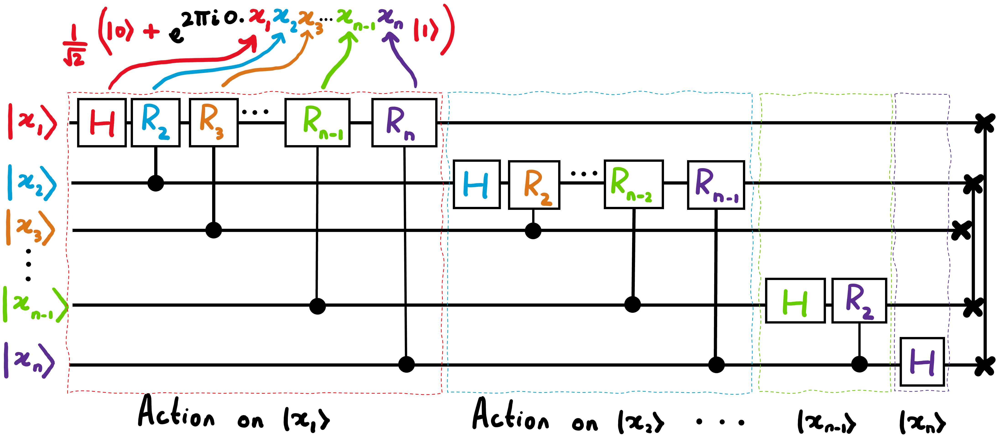

The $|x_1⟩$ is the most significant qubit, and $|x_n⟩$ is the least significant qubit in the previous diagram. While implementing the QFT on a quantum computer, it is important to keep in mind the qubit ordering used in the circuit above and the qubit ordering that a quantum library or language might use.

On the first qubit $|x_1⟩$, we perform a Hadamard operation, followed by a series of controlled rotations depending on the $n-1$  qubits that are less significant than $|x_1⟩$ . On the second qubit, we perform a Hadamard operation, followed by controlled rotations on $n-2$ qubits. This process continues until the Hadamard gate on the last qubit. The circuit so far produces the QFT in a reverse order which is easily corrected by adding SWAP gates between all the qubits at the end.

Finally, the complexity of the algorithms we discussed is the following.

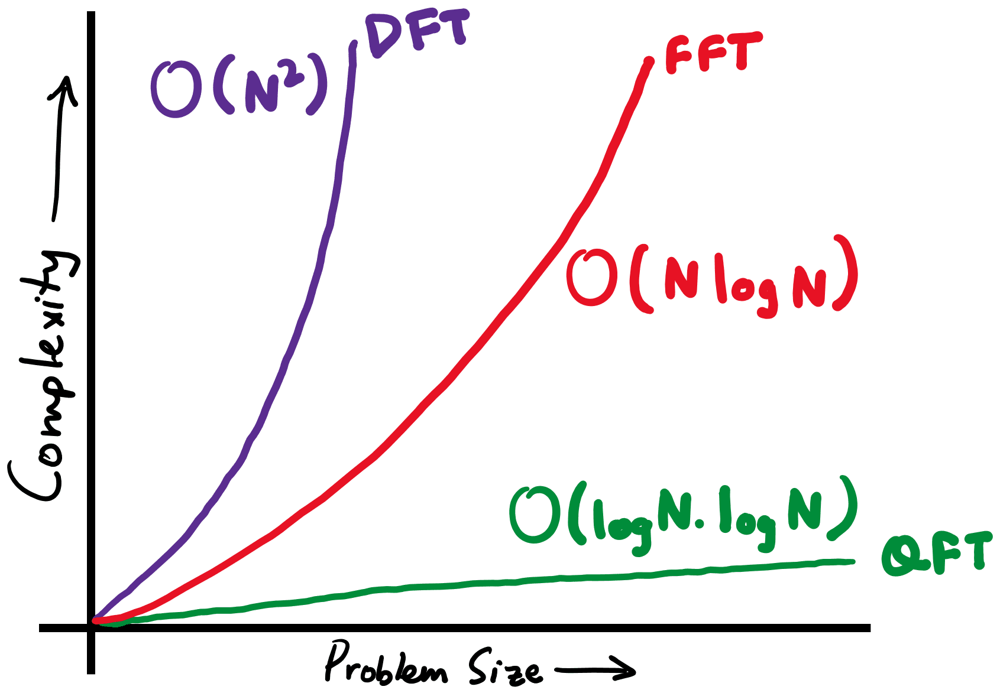













Finally, the following code shows the QFT circuit on $n$ qubits; see https://docs.pennylane.ai/en/stable/code/api/pennylane.QFT.html.

In [ ]:
dev = qml.device('default.qubit', wires=4)

@qml.qnode(dev)
def pennylane_qft(basis_id, n_qubits):
    """A that circuit performs the QFT using PennyLane's QFT template.

    Args:
        basis_id (int): An integer value identifying
            the basis state to construct.
        n_qubits (int): An integer identifying the
            number of qubits.

    Returns:
        array[complex]: The state after applying the QFT to the qubits.
    """
    # Prepare the basis state |basis_id>
    bits = [int(x) for x in np.binary_repr(basis_id, width=n_qubits)]
    qml.BasisStatePreparation(bits, wires=range(n_qubits))

    qml.QFT(wires= range(n_qubits))
    return qml.state()

## Phase estimation.

During the lectures, we discussed the terms *relative* and *global phases*. The latter does not affect measurement outcome probabilities at all and, as such, are *unobservable*, whereas *relative* phases can affect measurement outcomes if measured in a different basis. But if we had a situation where we *did* want to figure out the global phase, it turns out that this problem corresponds to figuring out the eigenvalue of a unitary operator corresponding to a given eigenvector. $U |\psi⟩=e^{2 \pi i \theta} |\psi⟩$, where $e^{2 \pi i \theta}$ is an eigenvalue with a unit norm,  which appears as a *global* phase in the output; we assume that we have the ability to prepare $|\psi⟩$ and apply $U$.

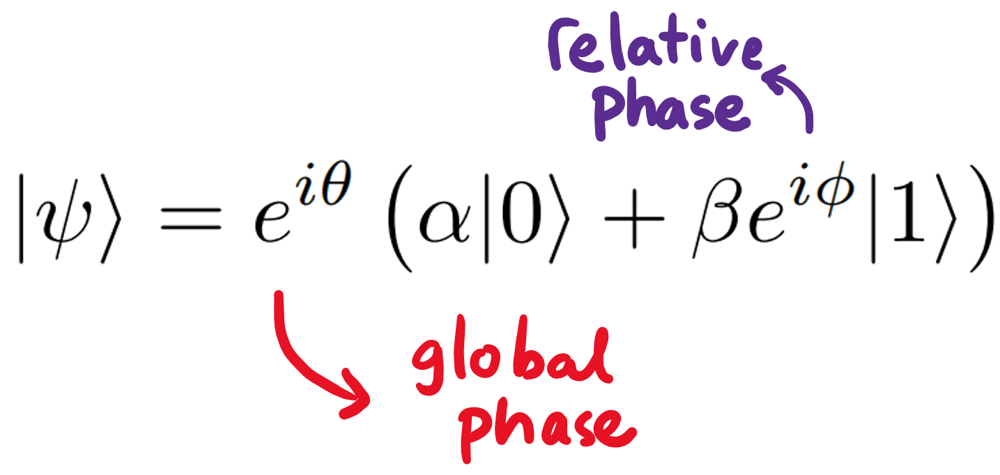

Moreover, since the eigenvectors form an orthonormal set, all unitary matrices can be written in a *diagonal representation* or an *orthonormal decomposition* (or equivalently, a *spectral decomposition*): $U = \sum_{\lambda} e^{2 \pi i θ_{λ}} |ψ_{\lambda}⟩⟨\psi_{λ}|$, where $e^{2 \pi i θ_{λ}}$ is an eigenvalue of the eigenvector $|ψ_{\lambda}⟩$.

### Phase kickback

A controlled unitary operation, given a set of *control* and *target* wires, applies the unitary to the target wires. In the case where the target are prepared in an eigenstate of the unitary, the eigenvalue corresponding to this eigenstate is *kicked back* to the control wires. Suppose the controlled unitary operation's unitary gate is $U$, and its eigenvector is $|\psi⟩$, where $U |\psi⟩ = e^{2 \pi i \theta} |\psi⟩$.

Then, the control wires pick up a phase of $e^{2 \pi i \theta}$. This is called *phase kickback*, and is demonstrated in the circuit below:

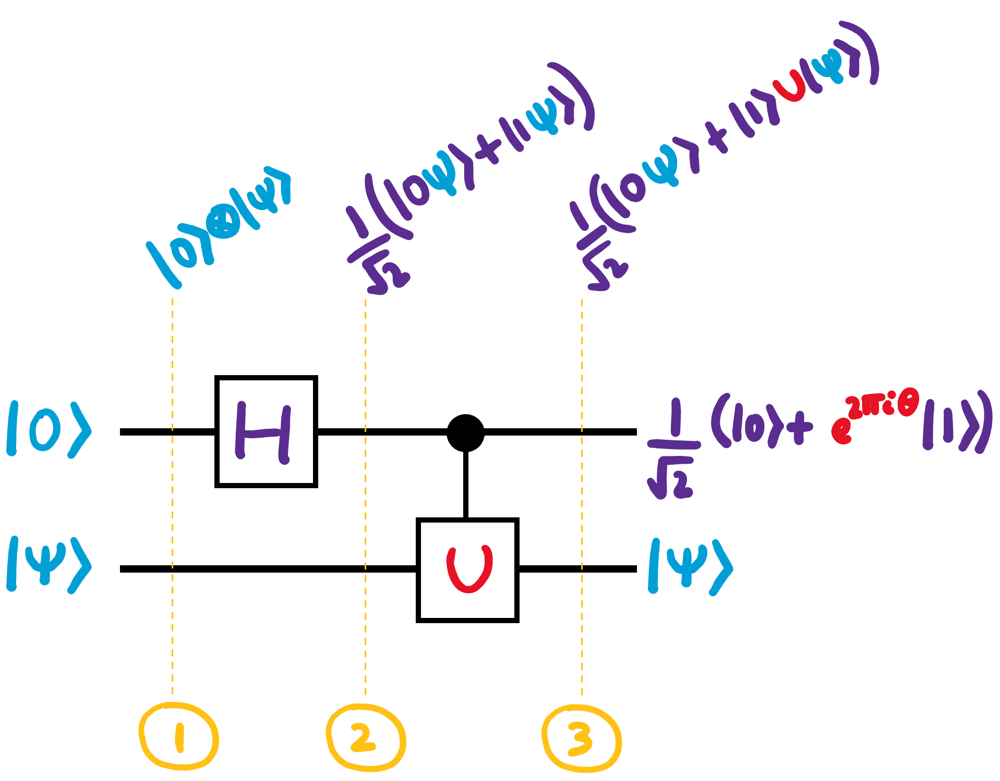

Thus, we have transformed the eigenvalue which was initially a global phase from into a relative phase on the control wire. This still doesn't solve our problem of finding the eigenvalue of $U$, but we are one step closer. If we change the basis by applying the Hadamard gate after the controlled unitary, we can obtain some more information.

*Phase kickback* or *eigenvalue kickback* is neat trick used by many quantum algorithms. We encountered it in *Deutsch's problem* or the *Deutsch-Jozsa* algorithm, where the function got encoded into the phase $|x⟩→(-1)^{f(x)}|x⟩$.

For QPE, we use and generalize the idea of phase kickback to encode the eigenvalue onto the control wires.

Let's try to estimate the phase angle  of the eigenvalue , corresponding to an eigenvector  of a unitary operator  using phase kickback. For Quantum Phase Estimation, we use and generalize the idea of phase kickback to encode the *eigenvalue* onto the control wires.

This code exercise implement the above circuit to see if we can detect a phase of $-1$. You are given a unitary that is promised to be either the $Z$ gate or the $-Z$ gate. Write a quantum program using phase kickback that will result in the state $|0⟩$ with a probability of $100\%$  on the first qubit if $Z$  is applied and $|1⟩$  with a probability of $100\%$  on the first qubit if $-Z$  is applied.

In [ ]:
dev = qml.device("default.qubit", wires=2)

@qml.qnode(dev)
def guess_the_unitary(unitary):
    """Given a unitary that performs a Z or a -Z operation
    on a qubit, guess which one it is.

    Args:
        U (array[complex]): A unitary matrix, guaranteed to be either Z or -Z.

    Returns:
        array [int]:  Probabilities on  on the first qubit
        using qml.probs()
    """
    qml.Hadamard(wires=0)
    qml.ctrl(qml.QubitUnitary,control=0)(unitary, wires=1)
    qml.Hadamard(wires=0)
    return qml.probs(wires=0)

# Z gate
# U = qml.PauliZ.compute_matrix()

# -Z gate
U = (-1)*qml.PauliZ.compute_matrix()

print(guess_the_unitary(U))

[0. 1.]


In this code exercise, we try to use the phase kickback circuit to find the eigenvalues of a given unitary operator with some eigenvalue $e^{2 \pi i \theta}$. In the phase kickback circuit, just before measurement, the state on the control wire is
\begin{equation}
    \left(\frac{1+e^{2 \pi i \theta}}{2}\right)|0⟩+\left(\frac{1-e^{2 \pi i \theta}}{2}\right)|1⟩,
\end{equation}
where we can see that the eigenvalue is encoded into the *relative phases* of the quantum state. Since we are using only one control wire, we can only get one bit of information in the output, i.e., 0 or 1. Let us choose a simple case where the eigenvalues are $\pm 1$ to find its eigenvalues.

In this code exercise, we find the eigenvalues of the $X$ gate by following the steps outlined below:



1.   Prepare an eigenvector of $X$  as input to the target wire.
2.   Apply the phase kickback circuit.
3.   Obtain the probabilities on the control wire.
4.   Use the probabilities  and  to calculate the eigenvalues.

Note that the eigenvectors of the $X$  gate are $|+⟩=\frac{1}{\sqrt{2}}(|0⟩+|1⟩)$ and $|-⟩=\frac{1}{\sqrt{2}}(|0⟩-|1⟩)$.

In [ ]:
dev = qml.device("default.qubit", wires=2)

@qml.qnode(dev)
def phase_kickback_X(eigenvector):
    """ Given an eigenvector of X,
    apply the phase kickback circuit to observe
    the probabilities on the control wire

    Args:
        eigenvector(String): A string "plus" or "minus" depicting
        the eigenvector of X

    Returns:
        array[int]: Measurement outcome on the first qubit using qml.probs()
    """
    # Prepare |ψ>
    ##################
    # YOUR CODE HERE #
    ##################
    if eigenvector != "plus":
        qml.PauliX(wires=1)
    qml.Hadamard(wires=1)
    # Phase kickback
    qml.Hadamard(wires=0)
    qml.CNOT(wires=[0,1])
    qml.Hadamard(wires=0)
    return qml.probs(wires=[0])

print(phase_kickback_X("plus"))
print(phase_kickback_X("minus"))

# MODIFY EIGENVALUES BELOW
eigenvalue_of_X_plus = 1
eigenvalue_of_X_minus = -1

[1. 0.]
[0. 1.]


Applying a unitary operator to one of its eigenvectors produces that eigenvector scaled by its eigenvalue, which manifests itself as a global phase on quantum computers. A global phase is indistinguishable when measuring, has no observable consequences, and therefore is usually ignored. However, if we did need to know the global phase or the *eigenvalue*, how could we go about finding it? In such cases, *it's not just a phase* that can be ignored.

Before, we saw how the *phase kickback trick* gives us some information about the global phase that is obtained when a unitary operator is applied to a quantum state. The Quantum Phase Estimation (QPE) is an extension of the phase kickback trick where the number of control qubits is increased (for more precision), and the unitary is applied multiple times at successive higher powers of two.

If we modify the phase kickback circuit
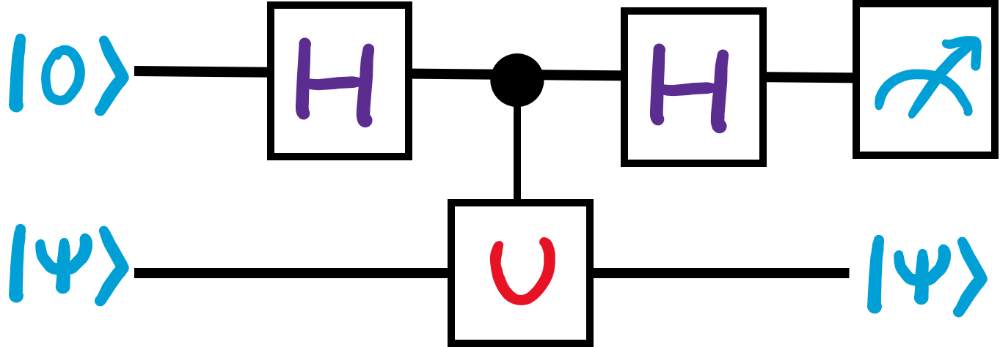

to the following circuit, by adding more control or *estimation* wires,

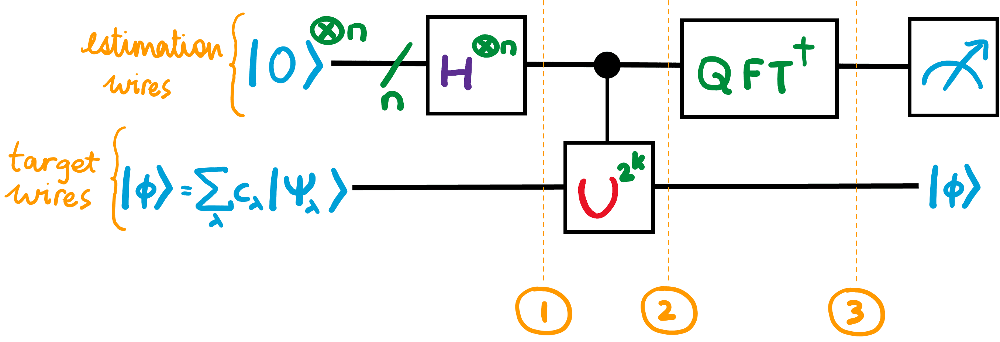

with the text in green representing the additions, we get the phase estimation circuit! Here $U^{2^k}$  means that the unitary is applied $2^k$ times, and $n$ is the number of **estimation wires**, which determines the precision to which we learn the phase.



The *fractional binary* representation makes a comeback for the QPE subroutine to depict the phase. For $n$ estimation wires, we have $n$ bits of precision
\begin{equation}
θ = 0.θ_1 θ_2 \ldots θ_n = \sum_{k=1}^{n} \frac{\theta_k}{2^{k}}
\end{equation}

where each $\theta_k$ can take a value of $0$  or $1$. Since we are discussing unitary operators having eigenvalues with a magnitude of $1$, the phase angle will be between $0$ and $1$ and thus can be expressed in this representation.

This is very similar to multiplication in base $10$, where multiplying a number by $10$ moves the decimal point one place to the right. The same is true for binary as well: multiplying a binary number by $2$ moves the decimal point one place to the right! In this case, since this happens in the exponent, $e^{2 \pi i \theta_1}$  can be only $1$ for $\theta_1=0$  or $1$.

Logically, it follows that applying $U$ $4$ times would move the decimal place two places to the right (if you wonder "why not apply $U$ three times?", think about this in base $10$, to move a decimal point two places to the right, you would multiply by $10^2=100$, and not $30$). This is where the $2^k$  in $U^{2^k}$  comes from.

A phase with $t$ bit precision can be written as follows,

\begin{equation}
\theta=0.\theta_1 θ_2 \ldots θ_t.
\end{equation}

By applying $U$ $2^k$ times, we are moving $k$ decimal places to the right, thereby giving us

\begin{equation}
U^{2^{k}}|ψ⟩= \exp[2 \pi i Θ_1 θ_2 \ldots θ_k θ_{k+1} \ldots θ_t] | ψ⟩= \exp[2 \pi i 0.θ_{k+1} \ldots θ_t] | ψ⟩
\end{equation}

Moving the decimal places to the right to somehow extract bits of the phase into the qubits is the central idea behind QPE.

We will now expand the circuit diagram shown above to show the details up to Step 2, and derive the intermediate representation before QFT is applied.

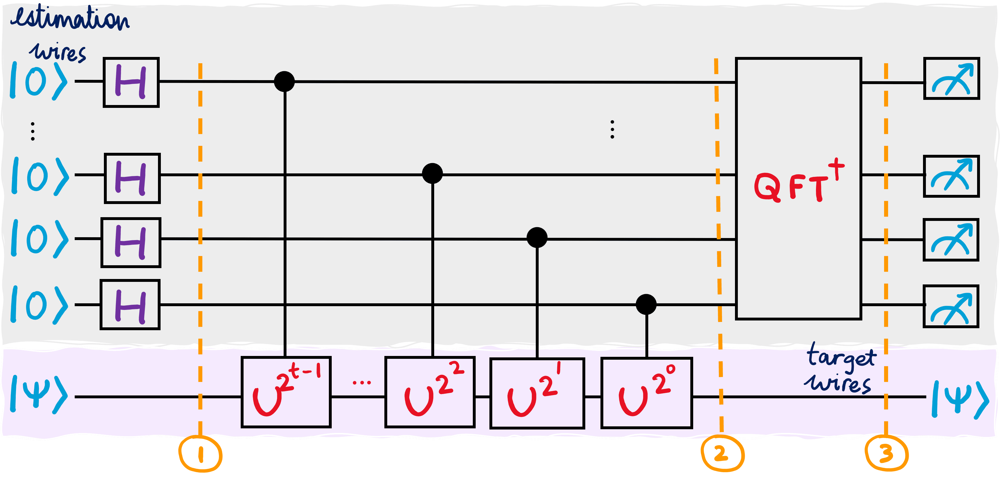



Note that the topmost qubit is the most significant qubit. Furthermore, the order of applying the controlled-$U^{2^{k}}$ rotations does not matter, as the phase obtained from each $U^{2^{k}}$ gets kicked back to the $k$-th estimation wire, without affecting anything else.

The state after Step 2,
\begin{equation}
    \frac{1}{2^{t/2}}[(|0⟩+e^{2 \pi i 0.x_n}|1⟩)(|0⟩+e^{2 \pi i 0.x_{n-1}x_n}|1⟩)⋯(|0⟩+e^{2 \pi i 0.x_1 x_2 \cdots x_n}|1⟩)]
\end{equation}

This is exactly the QFT $U_{QFT}|x_1 x_2 \ldots x_n ⟩$, where $n=t$ and $N=2^{t}$. Therefore, applying the inverse of the QFT circuit to the previous equation will produce $θ_1 θ_2 \ldots θ_t⟩|ψ⟩$.

We have successfully converted what was a global phase to relative phases, and then subsequently transferred that phase information into the state of the $t$ estimation qubits.

Measuring this in the computational basis will give us the exact phase. Why is it called *phase estimation* when the phase we have found here is exact? This is because we are assuming that the phase can be described exactly with $t$ bit binary expansion. If the phase cannot be expressed exactly with $t$  bits, we get an *estimate* of the phase.

The next code exercise implements the steps described above. See also the QPE in Pennylane; see https://docs.pennylane.ai/en/stable/code/api/pennylane.QuantumPhaseEstimation.html

In [ ]:
def U_power_2k(unitary, k):
    """ Computes U at a power of 2k (U^2^k)

    Args:
        unitary (array[complex]): A unitary matrix

    Returns:
        array[complex]: the unitary raised to the power of 2^k
    """
    return np.linalg.matrix_power(unitary, 2**k)


# Try out a higher power of U
U = qml.T.compute_matrix()
print(U)

U_power_2k(U, 2)


estimation_wires = [0, 1, 2]
target_wires = [3]

def apply_controlled_powers_of_U(unitary):
    """A quantum function that applies the sequence of powers of U^2^k to
    the estimation wires.

    Args:
        unitary (array [complex]): A unitary matrix
    """
    u = [U_power_2k(unitary, i) for i in range(len(estimation_wires))]
    u =list(reversed(u)) # reverse: list => tuple
    for i in range(len(estimation_wires)):
        qml.ControlledQubitUnitary(u[i],\
        control_wires = estimation_wires[i],wires=target_wires)


dev = qml.device("default.qubit", wires=4)

estimation_wires = [0, 1, 2]
target_wires = [3]

def prepare_eigenvector():
    qml.PauliX(wires=target_wires)

@qml.qnode(dev)
def qpe(unitary):
    """ Estimate the phase for a given unitary.

    Args:
        unitary (array[complex]): A unitary matrix.

    Returns:
        array[float]: Measurement outcome probabilities on the estimation wires.
    """
    prepare_eigenvector()
    for i in range(len(estimation_wires)):
        qml.Hadamard(wires= i)
    apply_controlled_powers_of_U(unitary)
    qml.adjoint(qml.QFT(wires= estimation_wires))
    return qml.probs(wires=estimation_wires)

U = qml.T.compute_matrix()
print(qpe(U))

estimation_wires = [0, 1, 2]
target_wires = [3]

def estimate_phase(probs):
    """Estimate the value of a phase given measurement outcome probabilities
    of the QPE routine.

    Args:
        probs (array[float]): Probabilities on the estimation wires.

    Returns:
        float: the estimated phase
    """
    increment = 2** -3
    arr= []
    for i in range(8):
        arr.append(i * increment)
    return float(sum(np.array(arr)*probs))


U = qml.T.compute_matrix()

probs = qpe(U)


dev = qml.device("default.qubit", wires=4)

estimation_wires = [0, 1, 2]
target_wires = [3]

def prepare_eigenvector():
    qml.PauliX(wires=target_wires)

@qml.qnode(dev)
def qpe(unitary):
    """Estimate the phase for a given unitary.

    Args:
        unitary (array[complex]): A unitary matrix.

    Returns:
        array[float]: Probabilities on the estimation wires.
    """

    prepare_eigenvector()

    qml.QuantumPhaseEstimation(unitary, target_wires,estimation_wires)
    return qml.probs(wires=estimation_wires)


U = qml.T.compute_matrix()
probs = qpe(U)
print(estimate_phase(probs))

[[1.        +0.j         0.        +0.j        ]
 [0.        +0.j         0.70710678+0.70710678j]]
[1.34786749e-32 1.00000000e+00 1.99734725e-32 6.25927232e-33
 3.18110547e-33 1.63704045e-33 6.15415682e-33 5.44075209e-33]
0.12499999999999994
